In [ ]:
# Scene Classification using CNN

In [ ]:
## Step 1: Importing all the packages

In [ ]:
 #! pip install tensorflow==2.0

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.8.0


In [ ]:
# import the necessary packages
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split

from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import random
import cv2
import os

import warnings
from tqdm import tqdm_notebook as tqdm
import itertools

warnings.filterwarnings("ignore")
SEED = 42   # set random seed

In [ ]:
# create CNN Model

class LeNet:
    @staticmethod
    def build(width, height, depth, classes):
        # initialize the model
        model = Sequential()
        inputShape = (height, width, depth)

        # if we are using "channels first", update the input shape
        if K.image_data_format() == "channels_first":
            inputShape = (depth, height, width)

        # first set of CONV => RELU => POOL layers
        model.add(Conv2D(20, (5, 5), padding="same",input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(50, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # first (and only) set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation("relu"))

        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # return the constructed network architecture
        return model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.chdir('/content/drive/MyDrive/CNN')

In [ ]:
!dir

CNN_project.ipynb  dataset\ (1)1     Scene.model	 test_examples\ (1)1
dataset		   dataset\ (1).rar  test_examples	 test_examples\ (1).rar
dataset\ (1)	   flagged	     test_examples\ (1)


In [ ]:
!pip install patool

     |████████████████████████████████| 77 kB 7.2 MB/s 


In [ ]:
import patoolib
patoolib.extract_archive('dataset (1).rar')

patool: Extracting dataset (1).rar ...
patool: running /usr/bin/unrar x -- "/content/drive/MyDrive/CNN/dataset (1).rar"
patool:     with cwd='./Unpack_1vh0el86'
patool: ... dataset (1).rar extracted to `dataset (1)2' (local file exists).


'dataset (1)2'

In [ ]:
import patoolib
patoolib.extract_archive('test_examples (1).rar')

patool: Extracting test_examples (1).rar ...
patool: running /usr/bin/unrar x -- "/content/drive/MyDrive/CNN/test_examples (1).rar"
patool:     with cwd='./Unpack_30z03lrj'
patool: ... test_examples (1).rar extracted to `test_examples (1)2' (local file exists).


'test_examples (1)2'

In [ ]:
DATASET = "dataset"  # this folde must contain three subfolder with images
MODEL = "Scene.model" # name to store the model on disk
PLOT = "plot.png" # plot name

In [ ]:
# initialize the number of epochs to train for, initia learning rate,
# and batch size
EPOCHS = 50
INIT_LR = 1e-3
BS = 32

In [ ]:
# initialize the data and labels
print("[INFO] loading images...")
data = []
labels = []

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images(DATASET)))
random.seed(42)
random.shuffle(imagePaths)

# progress bar 
with tqdm(total=len(imagePaths)) as pbar:
    
    # loop over the input images
    for idx, imagePath in enumerate(imagePaths):
        # load the image, pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (28, 28))
        image = img_to_array(image)
        data.append(image)

        # extract the class label from the image path and update the
        # labels list
        label = imagePath.split(os.path.sep)[-2]

        # label = 1 if label == "Good_pizza" else 0
        # print("ex: ", label)

        if label == "Buildings":
            label = 0
        elif label == "Forest":
            label = 1
        elif label == "Sea":
            label = 2

        # print("pr: ", label)	

        labels.append(label)
        
        # update the progressbar
        pbar.update(1)

[INFO] loading images...


  0%|          | 0/1326 [00:00<?, ?it/s]

In [ ]:
data[0]

array([[[237., 209., 198.],
        [240., 215., 205.],
        [237., 215., 204.],
        ...,
        [188., 143., 116.],
        [200., 156., 125.],
        [195., 138., 106.]],

       [[235., 207., 192.],
        [232., 210., 198.],
        [236., 217., 209.],
        ...,
        [214., 169., 145.],
        [182., 117.,  80.],
        [174., 113.,  77.]],

       [[228., 199., 184.],
        [243., 219., 206.],
        [245., 225., 214.],
        ...,
        [206., 154., 123.],
        [209., 156., 120.],
        [181., 118.,  81.]],

       ...,

       [[155., 164., 172.],
        [143., 152., 165.],
        [137., 149., 155.],
        ...,
        [ 66.,  57.,  54.],
        [ 17.,   9.,   7.],
        [ 14.,   6.,   6.]],

       [[ 97., 113., 129.],
        [113., 129., 141.],
        [119., 130., 140.],
        ...,
        [ 19.,  15.,  16.],
        [ 27.,  25.,  23.],
        [ 15.,  12.,  12.]],

       [[147., 159., 169.],
        [138., 149., 158.],
        [127., 1

In [ ]:
data[0].shape

(28, 28, 3)

In [ ]:
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

In [ ]:
labels

array([0, 1, 0, ..., 0, 0, 2])

In [ ]:
#Step 4: Creating your training and testing splits
# partition the data into training and testing splits using 75% of
# the data for training and the remaining 25% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.25, random_state=42)

In [ ]:
trainX.shape

(994, 28, 28, 3)

In [ ]:
trainY.shape

(994,)

In [ ]:
# convert the labels from integers to vectors
trainY = to_categorical(trainY, num_classes=3)
testY = to_categorical(testY, num_classes=3)

In [ ]:
trainY[0]

array([1., 0., 0.], dtype=float32)

In [ ]:
#Step 5: Data Preprocessing (Augumentation)
# construct the image generator for data augmentation
aug = ImageDataGenerator(rotation_range=30, 
                         width_shift_range=0.1, 
                         height_shift_range=0.1, 
                         shear_range=0.2, 
                         zoom_range=0.2, 
                         horizontal_flip=True, 
                         fill_mode="nearest")

In [ ]:
#Step 6: Compiling your tensorflow CNN model
# initialize the model
print("[INFO] compiling model...")
model = LeNet.build(width=28, height=28, depth=3, classes=3)
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

print("[INFO] model complied...")

[INFO] compiling model...
[INFO] model complied...


In [ ]:
print("[summary]")
print(model.summary())

[summary]
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 20)        1520      
                                                                 
 activation (Activation)     (None, 28, 28, 20)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 20)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 50)        25050     
                                                                 
 activation_1 (Activation)   (None, 14, 14, 50)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 50)         0         
 2D)                                          

In [ ]:
#Step 7: Training your model on your training data
# train the network
print("[INFO] training network...")
H = model.fit(x=aug.flow(trainX, trainY, batch_size=BS),
              validation_data=(testX, testY), 
              steps_per_epoch=len(trainX) // BS,
              epochs=EPOCHS, 
              verbose=1)

[INFO] training network...
Epoch 1/50
31/31 [==============================] - 11s 29ms/step - loss: 0.8983 - accuracy: 0.5832 - val_loss: 0.5894 - val_accuracy: 0.7319
Epoch 2/50
31/31 [==============================] - 1s 19ms/step - loss: 0.6539 - accuracy: 0.7110 - val_loss: 0.6252 - val_accuracy: 0.7169
Epoch 3/50
31/31 [==============================] - 1s 18ms/step - loss: 0.6356 - accuracy: 0.7121 - val_loss: 0.8904 - val_accuracy: 0.6295
Epoch 4/50
31/31 [==============================] - 1s 19ms/step - loss: 0.7394 - accuracy: 0.6933 - val_loss: 0.6296 - val_accuracy: 0.7078
Epoch 5/50
31/31 [==============================] - 1s 19ms/step - loss: 0.6006 - accuracy: 0.7630 - val_loss: 0.4689 - val_accuracy: 0.7982
Epoch 6/50
31/31 [==============================] - 1s 18ms/step - loss: 0.5355 - accuracy: 0.7900 - val_loss: 0.4314 - val_accuracy: 0.8283
Epoch 7/50
31/31 [==============================] - 1s 18ms/step - loss: 0.5136 - accuracy: 0.8035 - val_loss: 0.4970 - val_ac

In [ ]:
#Step 8: Saving the train model
# save the model to disk
print("[INFO] serializing network...")
model.save(MODEL, save_format="h5")

[INFO] serializing network...


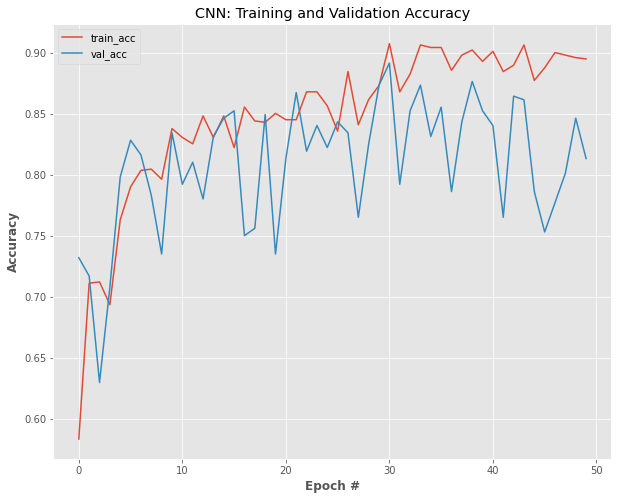

In [ ]:
#Step 9: Generate Plots for acc and val
# plot the training and validation accuracy
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("CNN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

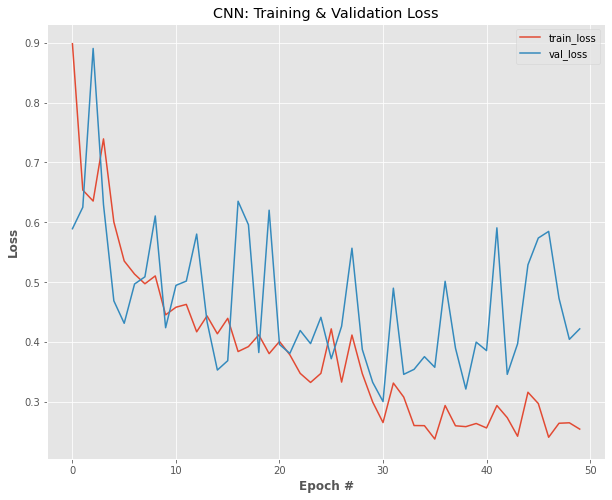

In [ ]:
# plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("CNN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

In [ ]:
#Step 10: Making predictions using your trained tensorflow model
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

[INFO] loading network and...


  0%|          | 0/28 [00:00<?, ?it/s]

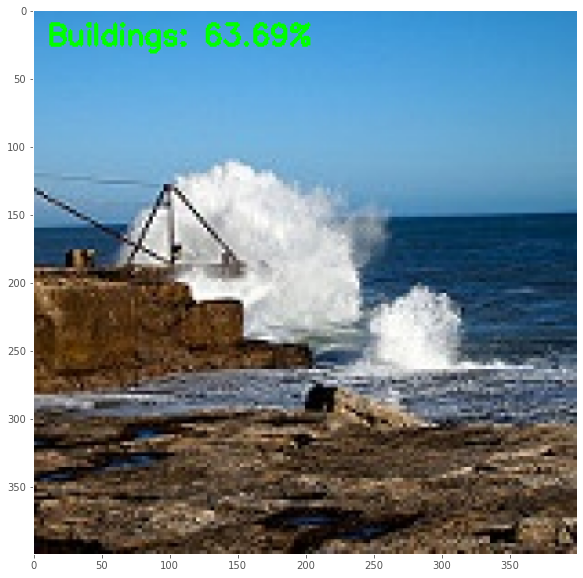

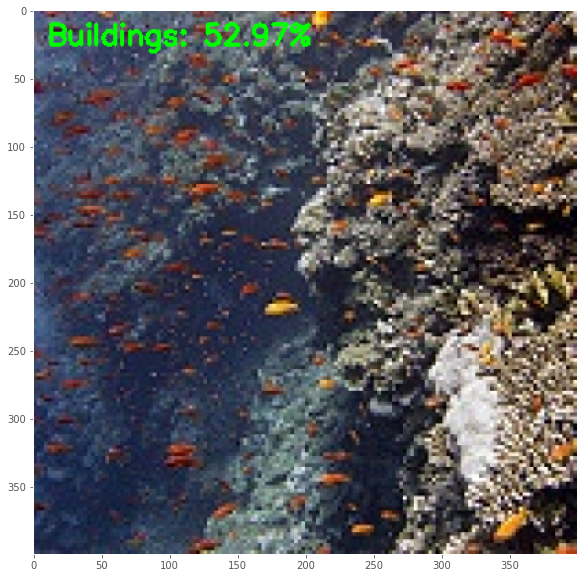

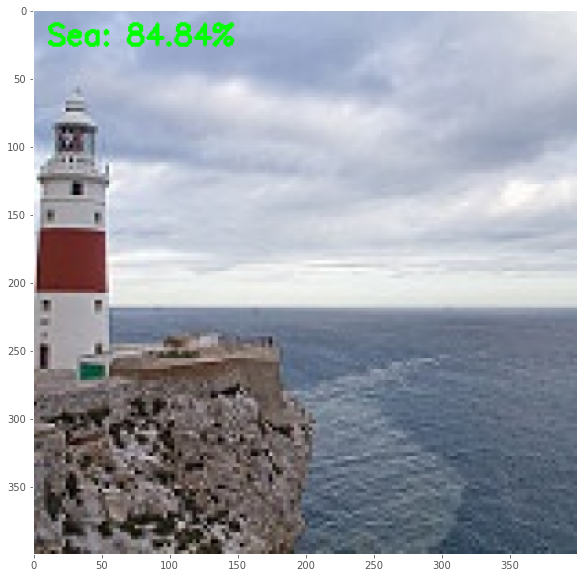

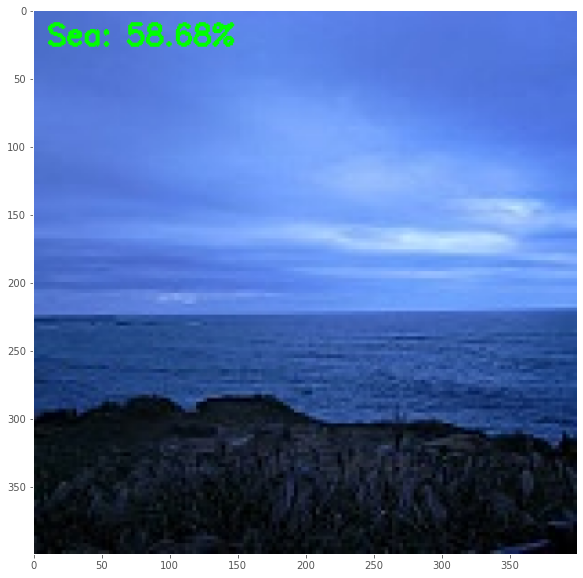

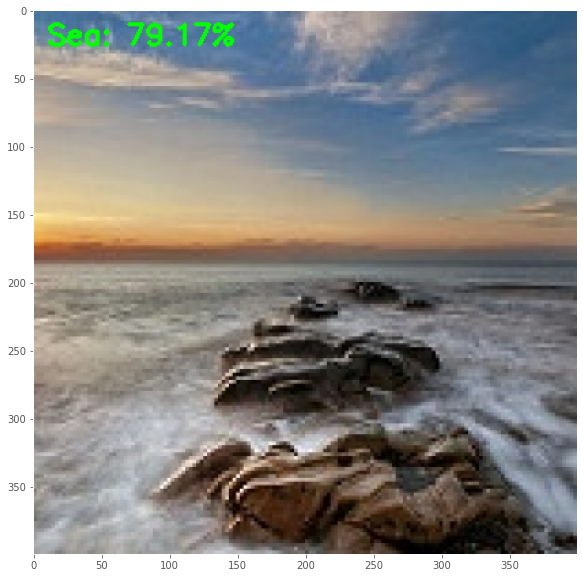

...

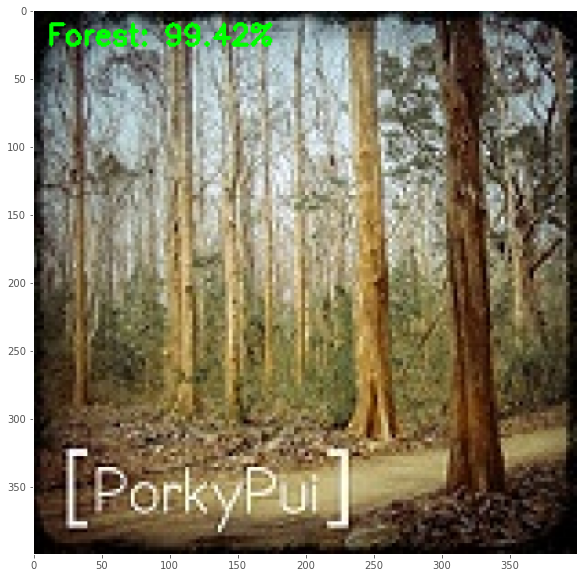

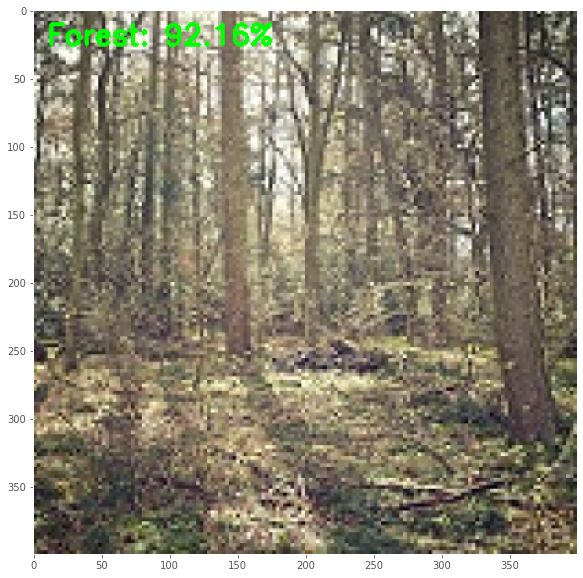

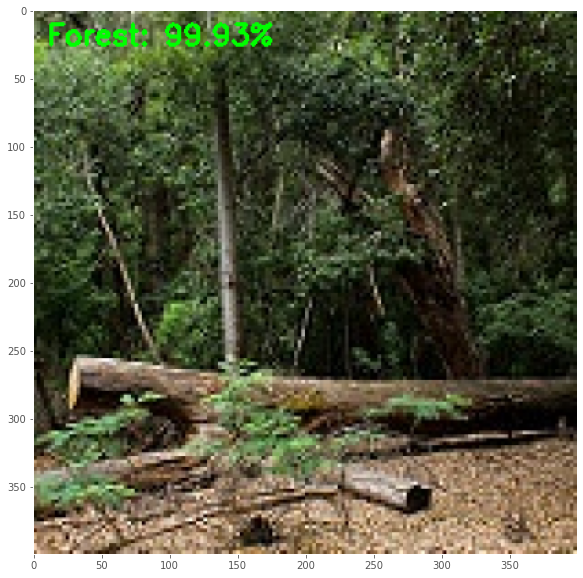

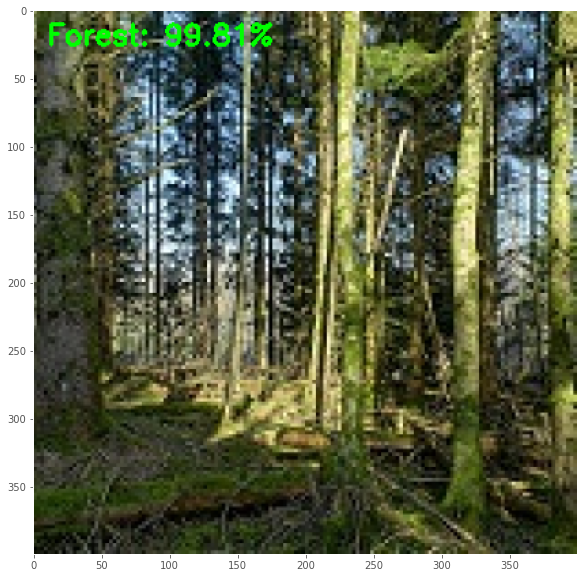

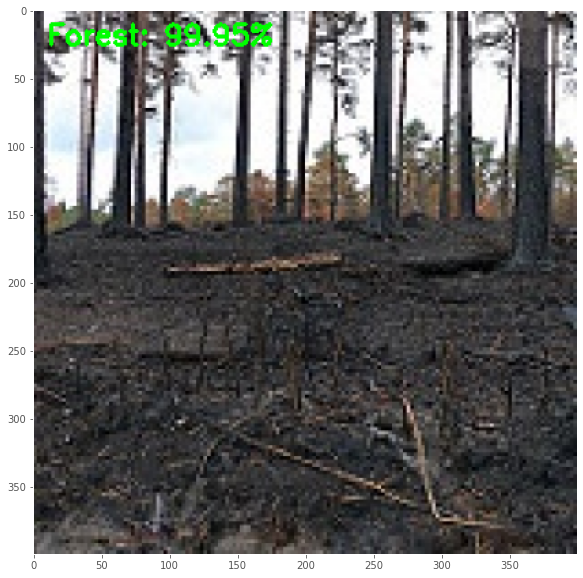

In [ ]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2

# # load the model 
print("[INFO] loading network and...")
#model = load_model(MODEL)

# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images('test_examples')))   # data folder with 2 categorical folders

all_class = ["Buildings", "Forest", "Sea"]


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        
        # load the image
        image = cv2.imread(imagePath)
        orig = image.copy()

        # pre-process the image for classification
        image = cv2.resize(image, (28, 28))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        # classify the input image
        prd_conf = model.predict(image)[0]

        # build the label
        label = all_class[np.argmax(prd_conf)]
        proba = prd_conf[np.argmax(prd_conf)]

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (0, 255, 0), 2)
        
        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)
        
        pbar.update(1)

In [ ]:
# Deployment

In [ ]:
!pip install gradio

     |████████████████████████████████| 1.7 MB 36.4 MB/s 
     |████████████████████████████████| 255 kB 1.6 MB/s 
     |████████████████████████████████| 211 kB 15.7 MB/s 
     |████████████████████████████████| 54 kB 2.5 MB/s 
     |████████████████████████████████| 1.1 MB 63.9 MB/s 
     |████████████████████████████████| 2.0 MB 60.9 MB/s 
     |████████████████████████████████| 53 kB 2.5 MB/s 
     |████████████████████████████████| 84 kB 3.4 MB/s 
     |████████████████████████████████| 271 kB 68.3 MB/s 
     |████████████████████████████████| 144 kB 13.9 MB/s 
     |████████████████████████████████| 94 kB 4.4 MB/s 
     |████████████████████████████████| 58 kB 8.0 MB/s 
     |████████████████████████████████| 10.9 MB 58.0 MB/s 
     |████████████████████████████████| 79 kB 10.3 MB/s 
     |████████████████████████████████| 43 kB 2.8 MB/s 
     |████████████████████████████████| 3.6 MB 58.0 MB/s 
     |████████████████████████████████| 856 kB 59.9 MB/s 
     |█████████████████████

In [ ]:
import gradio as gr
def predict_image(image):
    # load the image
    
    # pre-process the image for classification
    image = cv2.resize(image, (28, 28))
    image = image.astype("float") / 255.0
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

        
    preds = model.predict(image)[0]
    result = dict()
    result["Buildings"] = round(float(list(preds)[0]), 3)
    result["Forest"] = round(float(list(preds)[1]), 3)
    result["Sea"] = round(float(list(preds)[2]), 3)
    
    print(result)
    
    return result

In [ ]:
im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="CNN Demo_FAIZ").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://26957.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<fastapi.applications.FastAPI at 0x7f9c3029b510>,
 'http://127.0.0.1:7860/',
 'https://26957.gradio.app')